In [241]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import branca
from folium import Figure
from folium.plugins import HeatMap

In [242]:
crime_data = pd.read_csv('Crime_Data_from_2020_to_Present.csv')

# Основная информация по датасету

## Перевод названий колонок в camelCase

In [243]:
def converter(col):

  col = col.replace('_', ' ')
  col_lst = col.split()

  if len(col_lst) == 1:
    return col_lst[0].lower()

  return col_lst[0].lower() + ' '.join(col_lst[1:]).title().replace(' ', '')

In [244]:
crime_data.columns = [converter(col) for col in crime_data.columns]
crime_data.columns

Index(['drNo', 'dateRptd', 'dateOcc', 'timeOcc', 'area', 'areaName',
       'rptDistNo', 'part1-2', 'crmCd', 'crmCdDesc', 'mocodes', 'victAge',
       'victSex', 'victDescent', 'premisCd', 'premisDesc', 'weaponUsedCd',
       'weaponDesc', 'status', 'statusDesc', 'crmCd1', 'crmCd2', 'crmCd3',
       'crmCd4', 'location', 'crossStreet', 'lat', 'lon'],
      dtype='object')

## Значаения столбцов

1. drNo - номер дела
2. dateRptd - дата, когда преступление было зарегистрировано
3. dateOcc - дата, когда произошло преступление
4. timeOcc - время, когда было совершено преступление
5. area - район (Лос-Анджелес разделён на 21 географическую зону, каждая из которых закреплена за определённым полицейским участком)
6. areaName - полное название района или участка полиции, который контролирует эту территорию
7. rptDistNo - четырёхзначный код, который обозначает более мелкую территорию внутри указанного района
8. part1-2 - классификация преступления по уровню тяжести. 1 - серьёзные преступления, 2 - менее тяжкие преступления. По какому принципу их клссифицировали? Я не знаю.
9. crmCd - код преступления
10. crmCdDesc  - описание преступления, соответствующее коду (Crm Cd)
11. мocodes -
12. victAge - возраст жертвы
13. victSex - пол жертвы (F — женщина, M — мужчина, X — неустановленный пол)
14. victDescent - этническое происхождение жертвы (
Descent Code: A - Other Asian B - Black C - Chinese D - Cambodian F - Filipino G - Guamanian H - Hispanic/Latin/Mexican I - American Indian/Alaskan Native J - Japanese K - Korean L - Laotian O - Other P - Pacific Islander S - Samoan U - Hawaiian V - Vietnamese W - White X - Unknown Z - Asian Indian)
15. premisCd - код места преступления
16. premisDesc - расшифровка кода места преступления (Premis Cd). Например, "Жилой дом", "Магазин", "Парковка".
17. weaponUsedCd - код оружия
18. weaponDesc - расшифровка кода оружия (Weapon Used Cd)
19. status - статус дела ()
20. statusDesc - содержат поля: 'Adult Arrest', 'Invest Cont', 'Adult Other', 'Juv Arrest', 'Juv Other', 'UNK'
21. crmCd1 -
22. crmCd2 -
23. crmCd3 -
24. crmCd4 -
25. location - адрес места, где произошло преступление (округлен до ближайшей сотни кварталов для сохранения анонимности)
26. crossStreet - перекрёсток округленного адреса
27. lat - Широта
28. lon - Долгота

In [245]:
pd.set_option('display.max_columns', None) #чтобы были видны все столбцы
crime_data.head()

,drNo,dateRptd,dateOcc,timeOcc,area,areaName,rptDistNo,part1-2,crmCd,crmCdDesc,mocodes,victAge,victSex,victDescent,premisCd,premisDesc,weaponUsedCd,weaponDesc,status,statusDesc,crmCd1,crmCd2,crmCd3,crmCd4,location,crossStreet,lat,lon
0,190326475,03/01/2020 12:00:00 AM,03/01/2020 12:00:00 AM,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,NaN,0,M,O,101.0,STREET,NaN,NaN,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506
1,200106753,02/09/2020 12:00:00 AM,02/08/2020 12:00:00 AM,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,1822 1402 0344,47,M,O,128.0,BUS STOP/LAYOVER (ALSO QUERY 124),NaN,NaN,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628
2,200320258,11/11/2020 12:00:00 AM,11/04/2020 12:00:00 AM,1700,3,Southwest,356,1,480,BIKE - STOLEN,0344 1251,19,X,X,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002
3,200907217,05/10/2023 12:00:00 AM,03/10/2020 12:00:00 AM,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),0325 1501,19,M,O,405.0,CLOTHING STORE,NaN,NaN,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387
4,220614831,08/18/2022 12:00:00 AM,08/17/2020 12:00:00 AM,1200,6,Hollywood,666,2,354,THEFT OF IDENTITY,1822 1501 0930 2004,28,M,H,102.0,SIDEWALK,NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,1900 TRANSIENT,NaN,34.0944,-118.3277


In [246]:
crime_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 982638 entries, 0 to 982637
Data columns (total 28 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   drNo          982638 non-null  int64  
 1   dateRptd      982638 non-null  object 
 2   dateOcc       982638 non-null  object 
 3   timeOcc       982638 non-null  int64  
 4   area          982638 non-null  int64  
 5   areaName      982638 non-null  object 
 6   rptDistNo     982638 non-null  int64  
 7   part1-2       982638 non-null  int64  
 8   crmCd         982638 non-null  int64  
 9   crmCdDesc     982638 non-null  object 
 10  mocodes       837376 non-null  object 
 11  victAge       982638 non-null  int64  
 12  victSex       844193 non-null  object 
 13  victDescent   844182 non-null  object 
 14  premisCd      982624 non-null  float64
 15  premisDesc    982053 non-null  object 
 16  weaponUsedCd  326167 non-null  float64
 17  weaponDesc    326167 non-null  object 
 18  stat

# Предобработка данных

## Временные данные преобразуем в datetime

In [247]:
crime_data['dateOcc'] = pd.to_datetime(crime_data['dateOcc'])
crime_data['dateRptd'] = pd.to_datetime(
    crime_data['dateRptd'],
    format='%m/%d/%Y %I:%M:%S %p'
)
crime_data[['dateOcc', 'dateRptd']].info()

<ipython-input-247-9496d24072ae>:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  crime_data['dateOcc'] = pd.to_datetime(crime_data['dateOcc'])


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 982638 entries, 0 to 982637
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   dateOcc   982638 non-null  datetime64[ns]
 1   dateRptd  982638 non-null  datetime64[ns]
dtypes: datetime64[ns](2)
memory usage: 15.0 MB


## Обрезка датасета

На сайте, где были взяты данные, сообщалось, что с середины января 2024 года с получением данных возникли проблемы. Поэтому все преступления, совершённые с начала 2024 года, я удалю, чтобы они не искажали данные.

In [248]:
shape_before_chandge = crime_data.shape

In [249]:
crime_data = crime_data[crime_data['dateOcc'] < pd.Timestamp('2024-01-01')]
crime_data['dateOcc'].sort_values()[-5:]

,dateOcc
751734,2023-12-31
854183,2023-12-31
766017,2023-12-31
733138,2023-12-31
648499,2023-12-31


In [250]:
shape_before_chandge[0] - crime_data.shape[0]

105764

В итоге данных стало на 100 тысяч значений меньше

## Ознакомление с данными и очистка, если понадобится

### Просмотр 'victAge', 'victSex', 'victDescent'

Проверим на наличие NaNов эти столбцы

In [251]:
print('victSex:', crime_data['victSex'].isna().sum())
print('victAge:', crime_data['victAge'].isna().sum())
print('victDescent:', crime_data['victDescent'].isna().sum())

victSex: 115389
victAge: 0
victDescent: 115397


Количество NaNов у свойтсва 'victAge' равно нулю, так как пустые значения записывались, как 0.

In [252]:
crime_data_vict_age_is_null = crime_data[crime_data['victAge'] == 0]
crime_data_vict_age_is_null.shape[0]

218397

К остальным 100 тысячам нулям вернёмся позже.

Проверим, одинаковые ли записи содержат NaNы у 'victSex' и 'victDescent', и нули у 'victAge'.

In [253]:
nan_sex_descent_zero_age = crime_data[
    (crime_data['victSex'].isna()) &
    (crime_data['victDescent'].isna()) &
    (crime_data['victAge'] == 0)
]

nan_sex_descent_zero_age.shape

(115358, 28)

Действительно так.

Посмотрим, с чем может быть связанно такое количество NaNов.

In [254]:
nan_sex_descent_zero_age['crmCdDesc'].value_counts().head()

,count
crmCdDesc,
VEHICLE - STOLEN,93160
THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),18457
"EMBEZZLEMENT, GRAND THEFT ($950.01 & OVER)",1925
"VEHICLE, STOLEN - OTHER (MOTORIZED SCOOTERS, BIKES, ETC)",1105
"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",362


In [255]:
93160/116358

0.8006325306382028

80% преступлений из 115 тысяч нанов являются угонами автомобилей

In [256]:
crime_data['crmCdDesc'].value_counts().head()

,count
crmCdDesc,
VEHICLE - STOLEN,93660
BATTERY - SIMPLE ASSAULT,69422
THEFT OF IDENTITY,55963
BURGLARY FROM VEHICLE,53979
BURGLARY,53407


Все угоны автомобилей, кроме 500 значений, имеют наны в столбцах victDescent, victSex и нули в victAge. То есть, если я удалю эти наны, то в ЛА за 4 года всего 500 угонов автомобилей, во что не верится.

Очень навряд ли это ошибки при заполнении, скорее особенность заполнения, вызванная или обоснованная чем-то. Эти данные лучше не удалять, так как они ещё понадобятся, но иногда они будут мешаться, так что я сделаю копию датасета без этих данных.

Некоторые пропуски можно обосновать тем, что машина была зарегистрирована на юридическое лицо, организаци.,  государство и т.д.. А преступления с небольшим количеством пропусков можно обосновать ошибками/случайностями при заполнении.

In [257]:
crime_data_without_sex_descent_nans = crime_data[
    ~((crime_data['victSex'].isna()) &
     (crime_data['victDescent'].isna()) &
      (crime_data['victAge'] == 0))
]
crime_data.shape

(876874, 28)

### Отдельно 'victSex'

Какие значения есть в 'victSex'

In [258]:
crime_data['victSex'].value_counts()

,count
victSex,
M,360505
F,322226
X,78656
H,97
-,1


Удалим 'h', '-', так как их мало и неизвестно, что они означают, если это вообще не ошибки при заполнении.

In [259]:
crime_data = crime_data[~(crime_data['victSex'].isin(['H', '-']))]
crime_data.shape

(876776, 28)

Так же и копию очищенного датасета.

In [260]:
crime_data_without_sex_descent_nans = crime_data_without_sex_descent_nans[
    ~(crime_data_without_sex_descent_nans['victSex'].isin(['H', '-']))
]

Теперь имеем дело со значениями 'M', 'F' и 'X'. Что же означает 'X'?

При более детальном рассмотрении можно понять, что значения 'X' относятся к преступлениям, совершённым не против физических лиц, а в отношении организаций, магазинов, учреждений или других юридических лиц.

Давайте посмотрим на это.

In [261]:
x_vict_sex = crime_data[crime_data['victSex'] == 'X']

В 70 из 78 тысяч записей возраст заполнен нулю (вот и пришли к 70 тысячам из 100 тысяча нулей victAge), что указывает на то, что это перступления не в сторону физ лиц или опять какая-та особенность при заполнении.

In [262]:
x_vict_sex['victAge'].value_counts().head()

,count
victAge,
0,70422
22,2103
21,1789
19,1228
20,1128


Первые 20 преступлений описывают 90% данных

In [263]:
x_vict_sex['crmCdDesc'].value_counts()[:20].sum() / x_vict_sex.shape[0] * 100

90.4635374288039

Посмотрим какие преступления были совершены полом 'X'.

In [264]:
x_vict_sex['crmCdDesc'].value_counts()[:20]

,count
crmCdDesc,
SHOPLIFTING - PETTY THEFT ($950 & UNDER),12394
BURGLARY,12229
"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",10245
ROBBERY,5034
THEFT PLAIN - PETTY ($950 & UNDER),4630
TRESPASSING,4394
"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",3993
VANDALISM - MISDEAMEANOR ($399 OR UNDER),3724
SHOPLIFTING-GRAND THEFT ($950.01 & OVER),2395


Как видно, действительно, большое количество перступлений совершались по отношению к юридическим лицам. Также многие перступления двоякие, они могут относиться как к юр лицу, так и к физ лицу. Но раз они здесь, то скоре всего были совершены по отношению к юр лицу.

Посмотрим ещё раз, но в разрезе по возрасту.

In [265]:
x_vict_sex[x_vict_sex['victAge'] == 0]['crmCdDesc'].value_counts()[:10]

,count
crmCdDesc,
BURGLARY,11352
SHOPLIFTING - PETTY THEFT ($950 & UNDER),11035
"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",9359
ROBBERY,4547
THEFT PLAIN - PETTY ($950 & UNDER),4218
TRESPASSING,4104
"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",3663
VANDALISM - MISDEAMEANOR ($399 OR UNDER),3413
SHOPLIFTING-GRAND THEFT ($950.01 & OVER),2198


In [266]:
x_vict_sex[x_vict_sex['victAge'] != 0]['crmCdDesc'].value_counts()[:10]

,count
crmCdDesc,
SHOPLIFTING - PETTY THEFT ($950 & UNDER),1359
"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",886
BURGLARY,877
ROBBERY,487
"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",420
THEFT PLAIN - PETTY ($950 & UNDER),412
"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",330
VANDALISM - MISDEAMEANOR ($399 OR UNDER),311
TRESPASSING,290


В подтверждении этому, посмотрим, в каких местах происходили эти преступления.

In [267]:
x_vict_sex['premisDesc'].value_counts()[:50].sum()

70152

In [268]:
x_vict_sex['premisDesc'].value_counts()[:50]

,count
premisDesc,
OTHER BUSINESS,15461
STREET,8267
DEPARTMENT STORE,5606
RESTAURANT/FAST FOOD,3780
"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",3648
PARKING LOT,2772
MARKET,2032
CLOTHING STORE,2000
DRUG STORE,1966


Как видно во многих случаях это какие-то бизнесы, школы и т.д.

Так же, возможно, (если смотреть на таблицу выше) если преступление было направленно на групу лиц, то не заполнялись данные о жертве, поэтому возраст был равен 0.

Исходя из вышенаписанного, примим преступления с полом "X", как преступления над юридическими лицами, организациями, государственными учреждениями т.д.

### Отдельно 'victAge'

In [269]:
crime_data[crime_data['victAge'] <= 0]['victAge'].unique()

array([ 0, -2, -1, -3, -4])

Удалим значения меньше 0.


In [270]:
crime_data[crime_data['victAge'] < 0]['victAge'].shape

(131,)

In [271]:
crime_data = crime_data[crime_data['victAge'] >= 0]

Как мы поняли раннее, пол 'X' в большинстве случаев относится к преступлениям в сторону каких-либо организаций, в небольшом количестве. Но что на счёт остальных 32 тысяч записей с нулями? Для этого вернёмся к копии датасета очищенного от некоторых нанов.

In [272]:
crime_data_without_sex_descent_nans = (
    crime_data_without_sex_descent_nans[
        crime_data_without_sex_descent_nans['victAge'] >= 0
    ]
)

Сделаем новый набор данных для анализа.

In [273]:
zero_age_sex_not_x = crime_data_without_sex_descent_nans[
    (crime_data_without_sex_descent_nans['victAge'] == 0) &
    (crime_data_without_sex_descent_nans['victSex'] != 'X')
]

Просмотрим распределение пола.

In [274]:
zero_age_sex_not_x['victSex'].value_counts()

,count
victSex,
M,29041
F,3573


Надо выяснитьт, почему у возраста 0 указан пол.

Просмотрим места преступлений.

In [275]:
zero_age_sex_not_x['premisDesc'].value_counts()[:30]

,count
premisDesc,
OTHER BUSINESS,4895
STREET,4642
"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",1703
SINGLE FAMILY DWELLING,1612
PARKING LOT,1483
RESTAURANT/FAST FOOD,1374
DEPARTMENT STORE,1288
SIDEWALK,968
MARKET,853


После просмотра мест преступлений, можно сказать, что многие записи принадлежат преступлениям в сторону организаций, давайте проверим.

In [276]:
zero_age_sex_not_x['crmCdDesc'].value_counts()[:20]

,count
crmCdDesc,
BURGLARY,5285
"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",3737
SHOPLIFTING - PETTY THEFT ($950 & UNDER),3693
"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",1745
THEFT PLAIN - PETTY ($950 & UNDER),1599
ROBBERY,1391
"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",1366
VANDALISM - MISDEAMEANOR ($399 OR UNDER),1334
TRESPASSING,1178


Многие преступления действительно говорят о том, что они были совершены в сторону организации. Некоторые 50 на 50. Также есть преступления, которые были совершены над конкретным человеком.

Проверим, не случайности ли это при заполнении.

Создадим датасет, чтобы сравнить данные с общим количество преступлений.

In [277]:
zero_age_sex_not_x_crime_distribution = zero_age_sex_not_x['crmCdDesc'].value_counts()[:20].reset_index(name='crimeCount')

In [278]:
def total_crimes(x):
  return (crime_data['crmCdDesc'] == x).sum()

Добавим столбец общего количества этого типа преступлений.

In [279]:
zero_age_sex_not_x_crime_distribution['totalCrimes'] = (
    zero_age_sex_not_x_crime_distribution['crmCdDesc'].apply(lambda x: total_crimes(x))
)

In [280]:
zero_age_sex_not_x_crime_distribution

,crmCdDesc,crimeCount,totalCrimes
0,BURGLARY,5285,53399
1,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",3737,53115
2,SHOPLIFTING - PETTY THEFT ($950 & UNDER),3693,21832
3,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI...",1745,29116
4,THEFT PLAIN - PETTY ($950 & UNDER),1599,44851
5,ROBBERY,1391,29809
6,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",1366,49821
7,VANDALISM - MISDEAMEANOR ($399 OR UNDER),1334,22982
8,TRESPASSING,1178,12846
9,BATTERY POLICE (SIMPLE),788,2369


Думаю, теперь можно утверждать, что это ошибки/случайности при заполнении возраста или пола. Можно сгенерировать возраст для этих данных, на основе похожих случаев, но 32 тысячи это не очень большой объём от всего набора данных. Поэтому удалим эти записи.



In [281]:
crime_data = crime_data[
    ~((crime_data['victAge'] == 0) &
    (crime_data['victSex'] != 'X'))
]

### Отдельно 'victDescent'

Для удобства добавлю ещё раз:
Descent Code: A - Other Asian B - Black C - Chinese D - Cambodian F - Filipino G - Guamanian H - Hispanic/Latin/Mexican I - American Indian/Alaskan Native J - Japanese K - Korean L - Laotian O - Other P - Pacific Islander S - Samoan U - Hawaiian V - Vietnamese W - White X - Unknown Z - Asian Indian

In [282]:
crime_data['victDescent'].unique()

array(['O', 'X', 'H', 'B', 'W', 'A', 'K', 'C', 'J', 'F', 'I', 'V', 'S',
       'P', 'Z', nan, 'G', 'U', 'D', 'L', '-'], dtype=object)

In [283]:
crime_data['victDescent'].value_counts()

,count
victDescent,
H,263183
W,165410
B,122575
X,84430
O,58145
A,18911
K,4760
F,3693
C,3463


Удалим значение '-'.

In [284]:
crime_data = crime_data[crime_data['victDescent'] != '-']

In [285]:
crime_data['victDescent'].unique()

array(['O', 'X', 'H', 'B', 'W', 'A', 'K', 'C', 'J', 'F', 'I', 'V', 'S',
       'P', 'Z', nan, 'G', 'U', 'D', 'L'], dtype=object)

Некоторые расы можно объединить в группы побольше, сделаем это.

In [286]:
descent_mapping = {
    'C': 'Азиат',
    'J': 'Азиат',
    'K': 'Азиат',
    'V': 'Азиат',
    'L': 'Азиат',
    'D': 'Азиат',
    'Z': 'Азиат',
    'F': 'Азиат',
    'A': 'Азиат',
    'B': 'Афроамериканец',
    'H': 'Испаноговорящий',
    'I': 'Коренной американец',
    'G': 'Океания',
    'S': 'Океания',
    'U': 'Океания',
    'P': 'Океания',
    'W': 'Белый',
    'X': 'Неизвестная раса',
    'O': 'Другие'
}

def to_group(x):
    if pd.isna(x):
        return
    return descent_mapping.get(x, 'Unknown/Other')

In [287]:
crime_data['descentGroup'] = crime_data['victDescent'].apply(lambda x: to_group(x))

In [288]:
crime_data[['victDescent', 'descentGroup']].head()

,victDescent,descentGroup
1,O,Другие
2,X,Неизвестная раса
3,O,Другие
4,H,Испаноговорящий
5,H,Испаноговорящий


In [289]:
crime_data['victDescent'].unique()

array(['O', 'X', 'H', 'B', 'W', 'A', 'K', 'C', 'J', 'F', 'I', 'V', 'S',
       'P', 'Z', nan, 'G', 'U', 'D', 'L'], dtype=object)

# Подготовка данных для хороплетной карты

## Работа с crime_data и geojson

Удалим нулевые значения, которыми заполняли пропуски

In [290]:
a = crime_data.shape[0]

In [291]:
print(crime_data['lon'].isna().sum())
crime_data[(crime_data['lon'] == 0) & (crime_data['lat'] == 0)].shape[0]

0


2019

In [292]:
crime_data = crime_data[crime_data['lon'] != 0]

In [293]:
crime_data[(crime_data['lon'] == 0) & (crime_data['lat'] == 0)].shape[0]

0

Для того, чтобы связать точки преступлений и Choropleth, нужно объединить долготу и широту.

In [294]:
from shapely.geometry import Point
crime_data['crimePoint'] = crime_data[['lon', 'lat']].apply(lambda row: Point(row['lon'], row['lat']), axis=1)

In [295]:
crime_data['crimePoint'].head()

,crimePoint
1,POINT (-118.2628 34.0444)
2,POINT (-118.3002 34.021)
3,POINT (-118.4387 34.1576)
4,POINT (-118.3277 34.0944)
5,POINT (-118.2463 33.9467)


Преобразуем dataframe в geo для объединения с geojson

In [296]:
crime_gdf = gpd.GeoDataFrame(crime_data, geometry='crimePoint', crs="EPSG:4326")

Подгрузим geojson для выделения районов и сделаем из него GeoDataFrame для объединения с crima_data

In [297]:
geojson_path = 'los-angeles.geojson'
districts_gdf = gpd.read_file(geojson_path)
districts_gdf.shape

(114, 5)

Удалим ненужные столбцы из districts_gdf

In [298]:
districts_gdf = districts_gdf.drop(['cartodb_id', 'created_at', 'updated_at'], axis=1)
districts_gdf.head()

,name,geometry
0,Adams-Normandie,"MULTIPOLYGON (((-118.30901 34.03741, -118.3057..."
1,Arleta,"MULTIPOLYGON (((-118.42202 34.2241, -118.42282..."
2,Arlington Heights,"MULTIPOLYGON (((-118.31591 34.05261, -118.3155..."
3,Atwater Village,"MULTIPOLYGON (((-118.27832 34.15301, -118.2783..."
4,Baldwin Hills/Crenshaw,"MULTIPOLYGON (((-118.35626 34.02484, -118.3550..."


Объединим две таблицы

In [299]:
crime_in_districts = gpd.sjoin(
    crime_gdf,
    districts_gdf,
    how='left',
    predicate='intersects'
)

In [300]:
crime_in_districts.head()

,drNo,dateRptd,dateOcc,timeOcc,area,areaName,rptDistNo,part1-2,crmCd,crmCdDesc,mocodes,victAge,victSex,victDescent,premisCd,premisDesc,weaponUsedCd,weaponDesc,status,statusDesc,crmCd1,crmCd2,crmCd3,crmCd4,location,crossStreet,lat,lon,descentGroup,crimePoint,index_right,name
1,200106753,2020-02-09,2020-02-08,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,1822 1402 0344,47,M,O,128.0,BUS STOP/LAYOVER (ALSO QUERY 124),NaN,NaN,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628,Другие,POINT (-118.2628 34.0444),23.0,Downtown
2,200320258,2020-11-11,2020-11-04,1700,3,Southwest,356,1,480,BIKE - STOLEN,0344 1251,19,X,X,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002,Неизвестная раса,POINT (-118.3002 34.021),31.0,Exposition Park
3,200907217,2023-05-10,2020-03-10,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),0325 1501,19,M,O,405.0,CLOTHING STORE,NaN,NaN,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387,Другие,POINT (-118.4387 34.1576),84.0,Sherman Oaks
4,220614831,2022-08-18,2020-08-17,1200,6,Hollywood,666,2,354,THEFT OF IDENTITY,1822 1501 0930 2004,28,M,H,102.0,SIDEWALK,NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,1900 TRANSIENT,NaN,34.0944,-118.3277,Испаноговорящий,POINT (-118.3277 34.0944),47.0,Hollywood
5,231808869,2023-04-04,2020-12-01,2300,18,Southeast,1826,2,354,THEFT OF IDENTITY,1822 0100 0930 0929,41,M,H,501.0,SINGLE FAMILY DWELLING,NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,9900 COMPTON AV,NaN,33.9467,-118.2463,Испаноговорящий,POINT (-118.2463 33.9467),103.0,Watts


Удалим ненужный столбец.

In [301]:
del crime_in_districts['index_right']

## Почему не все записи отнеслись к районам?

Проверим, все ли записи отнеслись к районам.


In [302]:
crime_in_districts['name'].isna().sum()

3758

Выходит, что 3758 строк не относятся ни к какому району. Возможно это связано с тем, что они выходят за границы полигонов. Проверим.


Сперва нужно вытащить координаты каждого преступления без района ('crimePoint' сделанный выше не подходит, он нужен именно для Choropleth).

In [303]:
nan_rows_coord = crime_in_districts[
    crime_in_districts['name'].isna()
    ][['lat', 'lon']]

Визулизируем.

In [304]:
check_coord_figure = Figure(700, 700)

check_coord_map = folium.Map(location=[34.0522, -118.3837], zoom_start=10)

folium.GeoJson(
    districts_gdf,
    style_function=lambda feature: {
        "fillOpacity": "0",
        "color": "black",
        "weight": 2,
    },
).add_to(check_coord_map)

# метки преступлений
HeatMap(nan_rows_coord,
        radius=11
        ).add_to(check_coord_map)

check_coord_figure.add_child(check_coord_map)

Действительно, так и оказалось.

 # Хороплетная карта и тепловая

## df для хороплетной карты

Для удобства обрежем для хороплетной карты только нужные данные.

In [305]:
districts_by_crime_count = (
    crime_in_districts
    .groupby('name')
    .size()
    .reset_index(name='crimeCount')
)

districts_by_crime_count.head()

,name,crimeCount
0,Adams-Normandie,2946
1,Arleta,2491
2,Arlington Heights,4012
3,Atwater Village,1856
4,Baldwin Hills/Crenshaw,8467


Добавим к нему инфорамцию о полигонах районов.

In [306]:
districts_by_crime_count_with_geometry = (
    pd.merge(
        districts_gdf,
        districts_by_crime_count,
        on='name',
        how='inner'
    )
)

In [307]:
districts_by_crime_count_with_geometry.head()

,name,geometry,crimeCount
0,Adams-Normandie,"MULTIPOLYGON (((-118.30901 34.03741, -118.3057...",2946
1,Arleta,"MULTIPOLYGON (((-118.42202 34.2241, -118.42282...",2491
2,Arlington Heights,"MULTIPOLYGON (((-118.31591 34.05261, -118.3155...",4012
3,Atwater Village,"MULTIPOLYGON (((-118.27832 34.15301, -118.2783...",1856
4,Baldwin Hills/Crenshaw,"MULTIPOLYGON (((-118.35626 34.02484, -118.3550...",8467


## Хороплетная карта (рисунки 6 и 7)

Создадим уветовую шкалу.

In [308]:
from branca.colormap import linear

colormap = linear.YlOrRd_09.scale(
    min(districts_by_crime_count['crimeCount']),
    max(districts_by_crime_count['crimeCount'])
)

Добавим легенду.

In [309]:
colormap.caption = 'Количество преступлений'
colormap

Создадим датасет с индексом названием района и количеством преступлений. Нужно для того, чтобы к каждому конкретному району применялся конкретный цвет из цветовой шкалы.

In [310]:
crime_count_dict = districts_by_crime_count.set_index('name')['crimeCount']
crime_count_dict.head()

,crimeCount
name,
Adams-Normandie,2946
Arleta,2491
Arlington Heights,4012
Atwater Village,1856
Baldwin Hills/Crenshaw,8467


In [311]:
colormap(crime_count_dict['Arleta'])

'#fff9bdff'

In [312]:
choropleth_by_crime_count_figure = Figure(700, 700)

# задаём центр карты и начальный масштаб
choropleth_by_crime_count_map = folium.Map(
    location=[34.0522, -118.3837],
    zoom_start=10
)

folium.GeoJson(
    districts_by_crime_count_with_geometry, # датасет/geojson с полигонами
    # стиль оформления районов
    style_function=lambda feature: {
        "fillColor": colormap(
            crime_count_dict[feature['properties']['name']]
        ),
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.6,
    },
    # стиль района при наведении
    highlight_function=lambda feature: {
        'weight': 2.5,  # Меняем цвет границы при наведении
        'fillOpacity': 0.9,  # Прозрачность заливки при наведении
    },
    highlight=True,
    # всплывающее окно при наведении
    tooltip=folium.GeoJsonTooltip(
        fields=['name', 'crimeCount'],
        aliases=['Район', 'Количество преступлений']
    )
).add_to(choropleth_by_crime_count_map)

colormap.add_to(choropleth_by_crime_count_map)

choropleth_by_crime_count_figure.add_child(
    choropleth_by_crime_count_map
)

Баг (а может фича) при нажатии на район не фиксится.

In [313]:
districts_by_crime_count.sort_values(
    'crimeCount',
    ascending=False
)

,name,crimeCount
23,Downtown,54930
47,Hollywood,28707
108,Westlake,24258
52,Koreatown,21470
97,Van Nuys,19538
...,...,...
29,Elysian Valley,726
82,Sepulveda Basin,588
8,Beverlywood,573
40,Hansen Dam,227


666 доработать/изменить

На карте видно один очень большой красный кусок - это Downtown. Это место славится своей не безопасностью, так что это неудивительно. Второй район в списке имеет в целых два раза меньше преступлений.

Но у хороплетной карты есть недостаток, он окрашивает целый район, даже если 90% этого района - лес, или в каком-то конкретном небольшом месте района происходит очень большое количество преступлений, а в остальных местах он тихий. Из-за этого можно сделать ложные выводы. Поэтому сделаем ещё и тепловую карту.

Сделаем гистограмма по количеству преступлений в районах

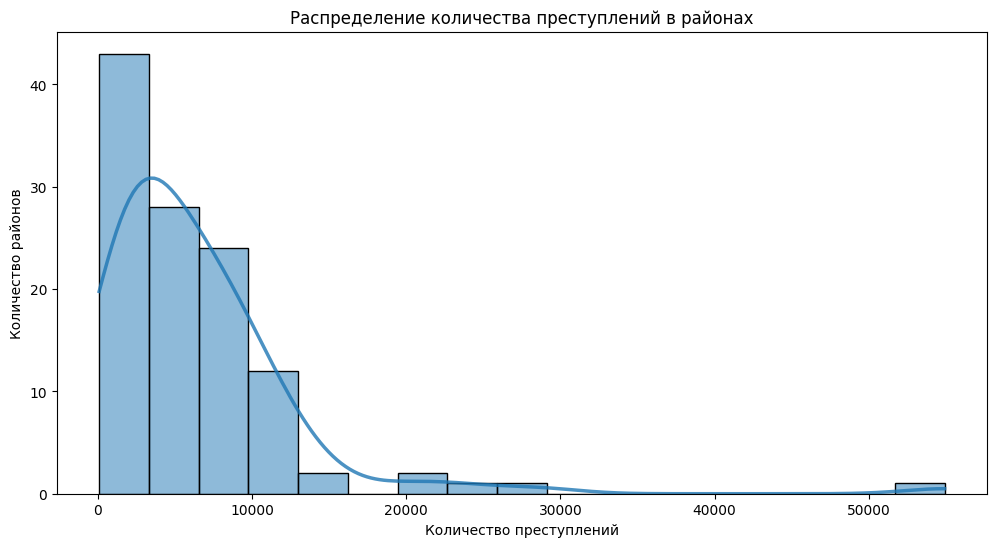

In [314]:
plt.figure(figsize=(12, 6))
sns.histplot(districts_by_crime_count['crimeCount'],
             bins=17,
             kde=True,
             line_kws={'linewidth': 2.5, 'alpha': 0.8}
)
plt.xlabel('Количество преступлений')
plt.ylabel('Количество районов')
plt.title('Распределение количества преступлений в районах')
plt.show()

Можно заметить, что количество преступлений по районам имеет график похожий на экспоненциальное распределение. У абсолютного большинства райнов (95%/108 штук) количество преступлений меньше 20000.

## Тепловая карта (рисунок 8)

Сделаем тепловую карту, чтобы увидеть более детальную картину по преступлениям


Сначала вытащим список из точек преступлений, чтобы подать его Heatmap

In [315]:
coords = crime_data[['lat', 'lon']].values
coords[:5]

array([[  34.0444, -118.2628],
       [  34.021 , -118.3002],
       [  34.1576, -118.4387],
       [  34.0944, -118.3277],
       [  33.9467, -118.2463]])

In [316]:
heatmap_by_crime_coord_figure = branca.element.Figure(700, 700)

heatmap_by_crime_coord_map = folium.Map(location=[34.0522, -118.3837], zoom_start=10)

# только тепловая карта
HeatMap(coords, radius=12).add_to(heatmap_by_crime_coord_map)

# добавление границ районов
folium.GeoJson(
    districts_by_crime_count_with_geometry,
    style_function=lambda feature: {
        "color": "black",
        "weight": 1,
        "fillOpacity": 0,
    },
    highlight_function=lambda feature: {
        'weight': 2.5,
        'fillOpacity': 0,
    },
    highlight=True,
    tooltip=folium.GeoJsonTooltip(
        fields=['name', 'crimeCount'],
        aliases=['Район', 'Количество преступлений']
    )
).add_to(heatmap_by_crime_coord_map)


heatmap_by_crime_coord_figure.add_child(heatmap_by_crime_coord_map)

При приближении можно заметить, что зелёные участки карты (леса, парки и тд) почти не окрашены, а также школы, торговые центры, колледжи. Всего этого нельзя было понять по хороплетной карте.

# Визуализации данных

## Визуализации 'victSex' (рисунок 1)

Сделаем датасет для визуализации.

In [317]:
sex_visualization = crime_data['victSex'].value_counts().reset_index(name='crimeCount')
sex_visualization

,victSex,crimeCount
0,M,330614
1,F,317772
2,X,78236


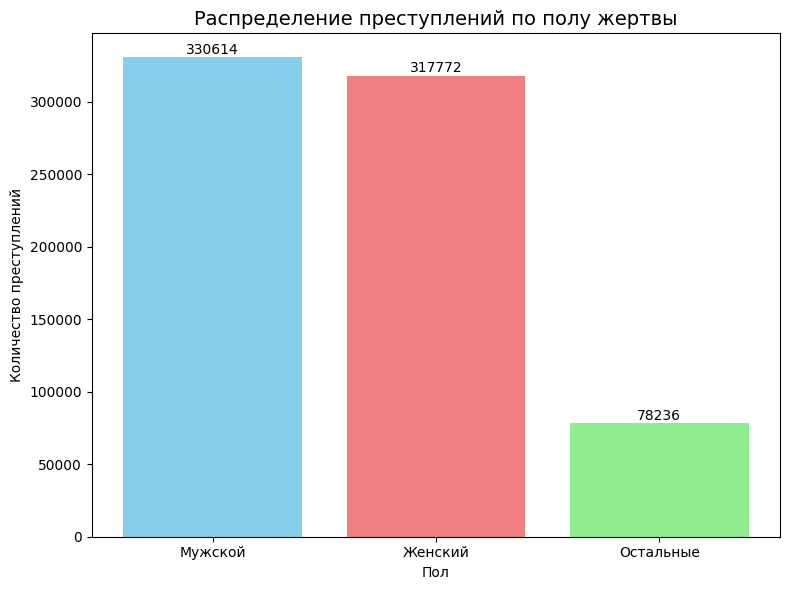

In [318]:
plt.figure(figsize=(8, 6))
bars = plt.bar(sex_visualization['victSex'],
               sex_visualization['crimeCount'],
               color=['skyblue', 'lightcoral', 'lightgreen']
)
plt.xlabel('Пол')
plt.ylabel('Количество преступлений')
plt.title('Распределение преступлений по полу жертвы', fontsize=14)
plt.xticks(ticks=[0, 1, 2],
           labels=['Мужской', 'Женский', 'Остальные']
)

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,
             yval + 500,
             yval,
             ha='center',
             va='bottom'
)

plt.tight_layout()
plt.show()

## Визулизация 'victAge' (рисунок 2)

Сделаем гистограмму по возрасту пострадавших. Удалим возраст 0, так как в нём нет смысла в графике распределения возраста жертв преступлений.

In [319]:
age_visualization = crime_data[crime_data['victAge'] > 0]['victAge']

In [320]:
age_visualization.describe()

,victAge
count,656545.000000
mean,39.568732
std,15.608221
min,2.000000
25%,28.000000
50%,37.000000
75%,50.000000
max,120.000000


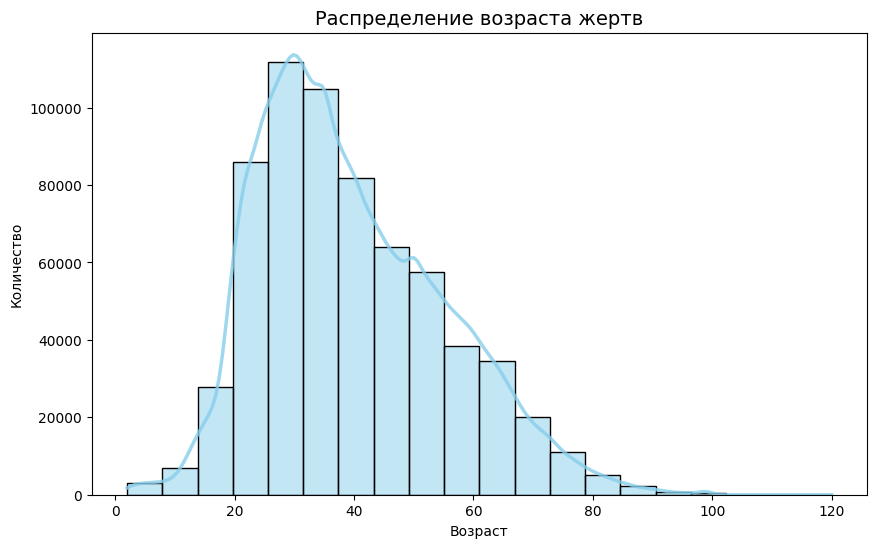

In [321]:
plt.figure(figsize=(10, 6))
sns.histplot(age_visualization,
             bins=20,
             kde=True,
             color='skyblue',
             line_kws={'linewidth': 2.5, 'alpha': 0.8}
)
plt.xlabel('Возраст')
plt.ylabel('Количество')
plt.title('Распределение возраста жертв', fontsize=14)
plt.show()

## Визуализация 'victDescent' (рисунок 3)

Сначала обратимся к официальным данным за 2024 по городу Лос-Анджелес по проценту насаления этнических групп:

- 48,5% - испаноговорящие
- 29,8% - белые
- 11,3% - азиаты
- 9,6% - афроамериканцы
- 0,7% - индийцы (коренные жители)
- 0,1% - гавайцы, самоанцы, фиджийцы

Проверим, представлены ли жертвы разных этнических групп в тех же пропорциях, что и их доля в общем населении.

In [322]:
crime_data_without_sex_descent_nans['victDescent'].value_counts()

,count
victDescent,
H,267644
W,178323
B,124010
X,86553
O,69419
A,19229
K,4784
F,3708
C,3466


In [323]:
crime_data[crime_data['descentGroup'] == 'Unknown/Other']['victDescent'].value_counts()

,count
victDescent,


In [324]:
crimes_by_descent = crime_data['descentGroup'].value_counts().reset_index(name='crimeCount')
crimes_by_descent

,descentGroup,crimeCount
0,Испаноговорящий,262407
1,Белый,165031
2,Афроамериканец,122247
3,Неизвестная раса,84083
4,Другие,58007
5,Азиат,33519
6,Коренной американец,836
7,Океания,491


<ipython-input-325-ad6b114a1534>:2: UserWarning: The palette list has more values (10) than needed (8), which may not be intended.
  sns.barplot(x='crimeCount',


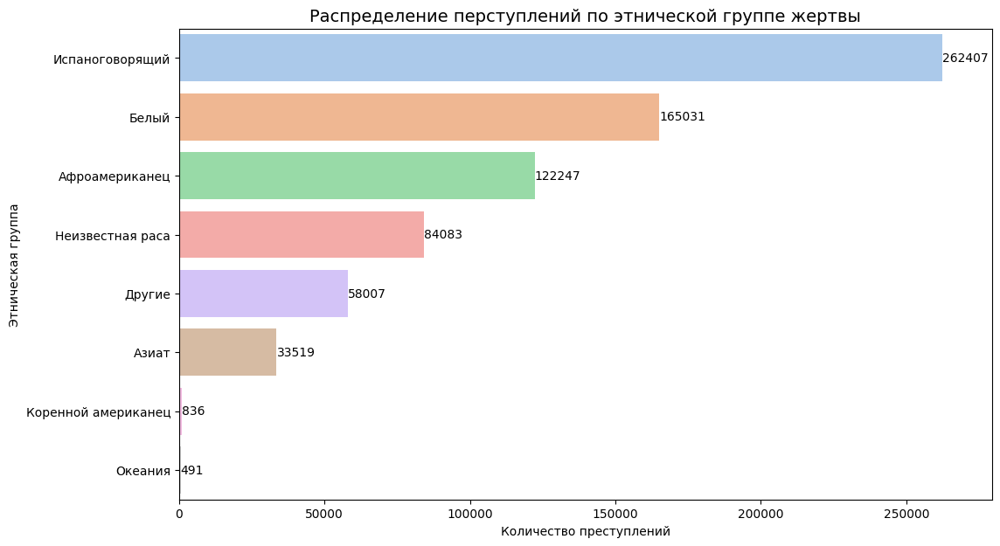

In [325]:
plt.figure(figsize=(12, 7))
sns.barplot(x='crimeCount',
            y='descentGroup',
            data=crimes_by_descent,
            hue='descentGroup',
            palette=sns.color_palette("pastel")
)
for i, row in crimes_by_descent.iterrows():
    plt.text(
        x=row['crimeCount'] + 2,
        y=i,
        s=str(row['crimeCount']),
        va='center',
        fontsize=10
    )

plt.xlim(0, crimes_by_descent['crimeCount'].max() * 1.065)


plt.title('Распределение перступлений по этнической группе жертвы', fontsize=14)
plt.xlabel('Количество преступлений')
plt.ylabel('Этническая группа')
plt.show()

## Распределение преступлений по возрасту и полу жертв (рисунок 4)


Посторим график распределения по возрасту и полу, тем самы выявив наиболее подверженные преступлениям слои населения.



Сгруппируем возраст в отрезки по 5, добавим эту информацию в новый столбец.

In [326]:
def age_by_step(age):
    start = (age // 5) * 5
    end = start + 4
    return f"{start}-{end}"

In [327]:
crime_data['ageByStep5'] = crime_data['victAge'].apply(lambda x: age_by_step(x))

In [328]:
male_population_step = (crime_data[crime_data['victSex'] == 'M']
                   .groupby('ageByStep5')
                   .size()
                   .reset_index(name='crimeCount')
)
female_population_step = (crime_data[crime_data['victSex'] == 'F']
                   .groupby('ageByStep5')
                   .size()
                   .reset_index(name='crimeCount')
)

Отсортируем группы возраста.

In [329]:
age_order_step = [
    '0-4', '5-9', '10-14', '15-19', '20-24', '25-29',
    '30-34', '35-39', '40-44', '45-49', '50-54', '55-59',
    '60-64', '65-69', '70-74', '75-79', '80-84', '85-89',
    '90-94', '95-99'
]

male_population_step['ageByStep5'] = pd.Categorical(
    male_population_step['ageByStep5'], categories=age_order_step, ordered=True
)
female_population_step['ageByStep5'] = pd.Categorical(
    female_population_step['ageByStep5'], categories=age_order_step, ordered=True
)

male_population_step = male_population_step.sort_values('ageByStep5')
female_population_step = female_population_step.sort_values('ageByStep5')


Изменим значения количества преступлений мужчин на отрицаьельные для визуализации

In [330]:
male_population_step['crimeCount'] = -male_population_step['crimeCount']

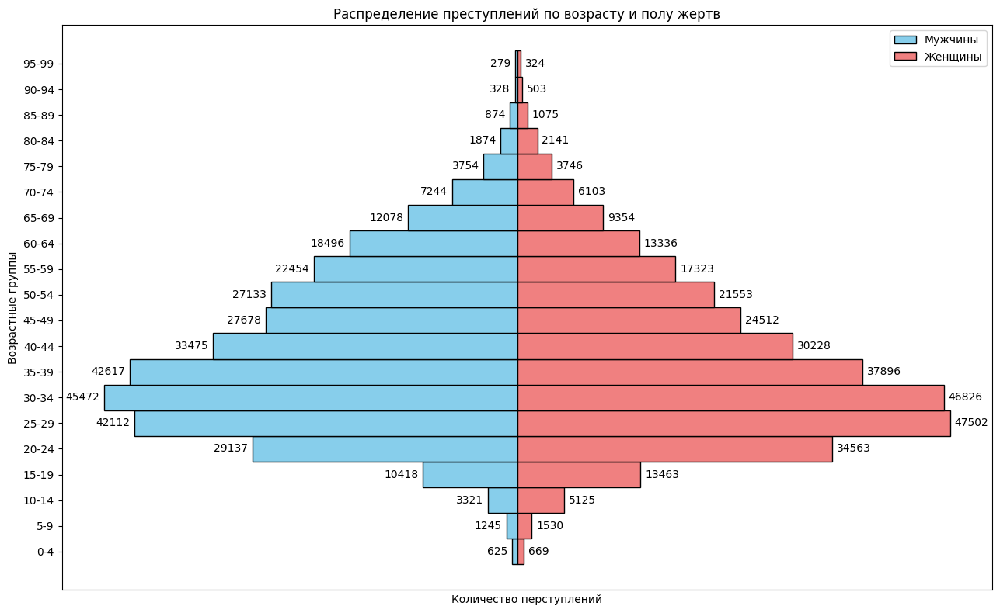

In [331]:
fig, ax = plt.subplots(figsize=(13, 8))

ax.barh(age_order_step,
        male_population_step['crimeCount'],
        color='skyblue',
        label='Мужчины',
        height=1,
        edgecolor='black'
)

ax.barh(age_order_step,
        female_population_step['crimeCount'],
        color='lightcoral',
        label='Женщины',
        height=1,
        edgecolor='black'
)

for i, age_group in enumerate(age_order_step):
    male_value = male_population_step.loc[
        male_population_step['ageByStep5'] == age_group, 'crimeCount'
        ].values[0]
    ax.text(x=male_value - 500, y=i, s=str(-male_value),
            va='center', ha='right', color='black', fontsize=10)

    female_value = female_population_step.loc[
        female_population_step['ageByStep5'] == age_group, 'crimeCount'
        ].values[0]
    ax.text(x=female_value + 500, y=i, s=str(female_value),
            va='center', ha='left', color='black', fontsize=10)


ax.set_xlabel('Количество перступлений')
ax.set_xticks([])
ax.set_ylabel('Возрастные группы')
ax.set_title('Распределение преступлений по возрасту и полу жертв')
ax.legend()

plt.tight_layout()
plt.show()

## "premisDesc" (рисунок 5)

In [332]:
premis_desc_visualization = (
    crime_data['premisDesc'].value_counts()[:20].reset_index(name='crimeCount')
)

In [333]:
premis_desc_visualization

,premisDesc,crimeCount
0,SINGLE FAMILY DWELLING,146922
1,STREET,127896
2,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",105776
3,PARKING LOT,44406
4,SIDEWALK,36164
5,OTHER BUSINESS,34495
6,"VEHICLE, PASSENGER/TRUCK",24987
7,GARAGE/CARPORT,13244
8,DRIVEWAY,10296
9,RESTAURANT/FAST FOOD,9696


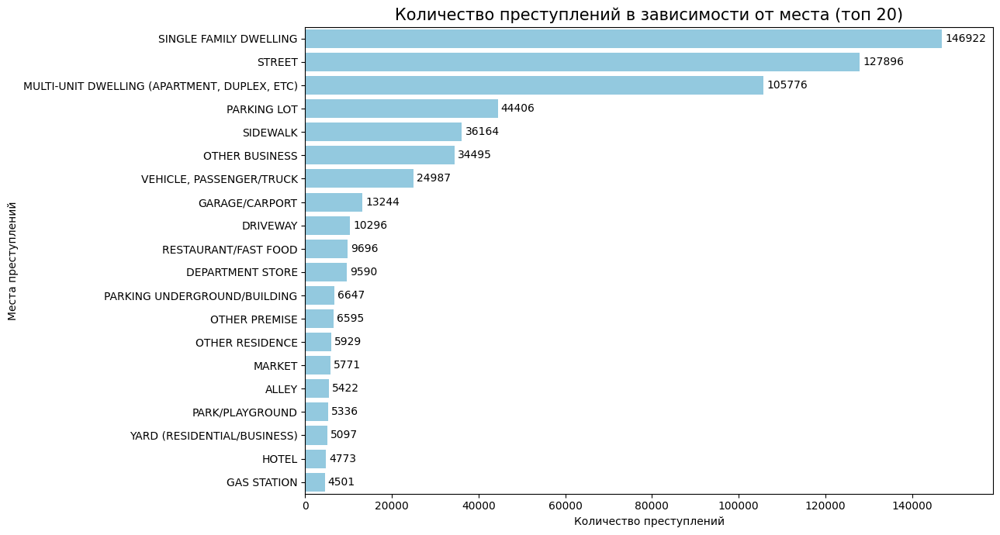

In [334]:
plt.figure(figsize=(13, 7))
ax = sns.barplot(x='crimeCount',
            y='premisDesc',
            data=premis_desc_visualization,
            color='skyblue'
)
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f', padding=3, fontsize=10)

ax.set_xlim(0, premis_desc_visualization['crimeCount'].max() * 1.08)

plt.title('Количество преступлений в зависимости от места (топ 20)', fontsize=15)
plt.ylabel('Места преступлений')
plt.xlabel('Количество преступлений')
plt.tight_layout()
plt.show()

In [335]:
premis_desc_visualization['crimeCount'].head(3).sum() / crime_data.shape[0]

0.523763061598865

 ## Количество преступлений по дням за 4 года (рисунок 9)

In [336]:
pip install calplot

In [337]:
crimes_by_day = crime_data['dateOcc'].value_counts()
crimes_by_day.head()

,count
dateOcc,
2020-01-01,1076
2023-01-01,1027
2022-12-02,1012
2023-02-01,973
2022-10-01,946


In [338]:
sort_crimes_by_day = crimes_by_day.reset_index(name='crimeCount').sort_values('dateOcc')

(<Figure size 1250x680 with 5 Axes>,
 array([<Axes: ylabel='2020'>, <Axes: ylabel='2021'>,
        <Axes: ylabel='2022'>, <Axes: ylabel='2023'>], dtype=object))

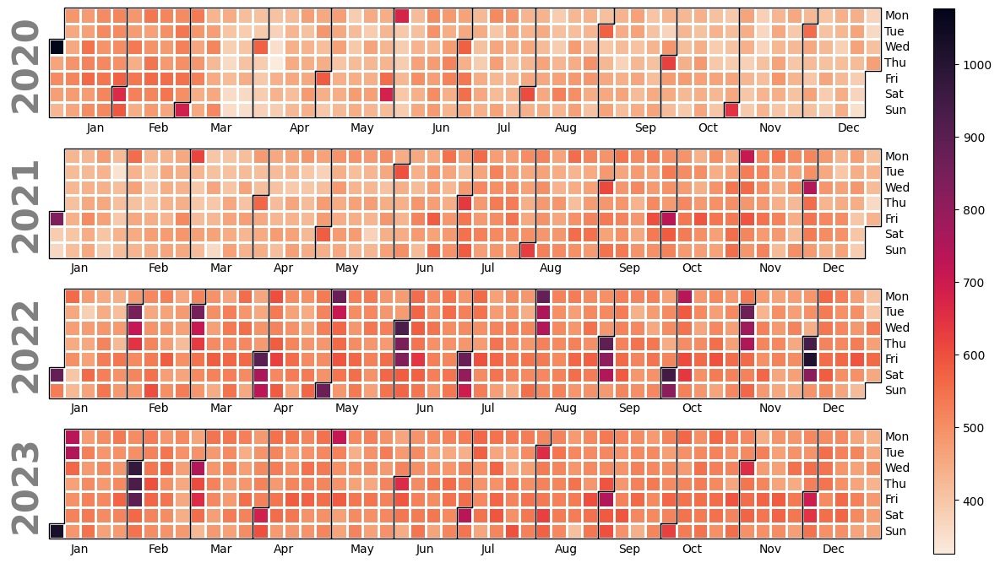

In [339]:
import calplot

calplot.calplot(crimes_by_day,
                cmap='rocket_r',
                colorbar=True,
                linewidth=1,
                edgecolor='black'
)

## Количество преступлений по часам (рисунок 10)

In [340]:
crime_data['timeOfCrime'] = crime_data['timeOcc'] // 100
crime_data['timeOfCrime'].head()

,timeOfCrime
1,18
2,17
3,20
4,12
5,23


In [341]:
crimes_count_by_hour = crime_data.groupby('timeOfCrime').size().reset_index(name='crimeCount')
crimes_count_by_hour.head()

,timeOfCrime,crimeCount
0,0,31469
1,1,22430
2,2,18673
3,3,16236
4,4,13586


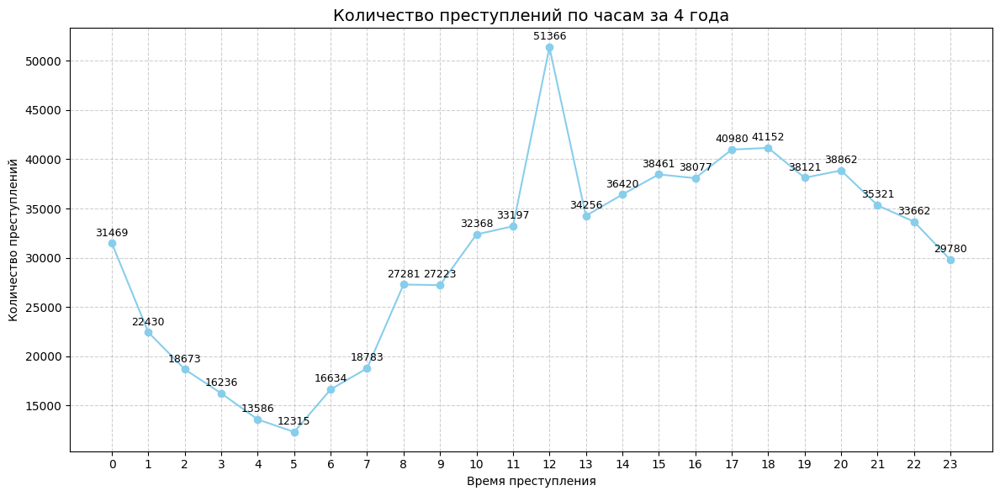

In [342]:
plt.figure(figsize=(12, 6))
plt.plot(crimes_count_by_hour['timeOfCrime'],
         crimes_count_by_hour['crimeCount'],
         marker='o',
         linestyle='-',
         color='skyblue',
         label='Crime Count'
)

plt.title('Количество преступлений по часам за 4 года', fontsize=14)
plt.xlabel('Время преступления')
plt.ylabel('Количество преступлений')
plt.xticks(ticks=crimes_count_by_hour['timeOfCrime'].unique())
plt.grid(True, linestyle='--', alpha=0.6)

for x, y in zip(crimes_count_by_hour['timeOfCrime'], crimes_count_by_hour['crimeCount']):
    plt.text(x, y + 750, f'{y}', fontsize=9, ha='center', color='black')

plt.tight_layout()
plt.show()
